<a href="https://colab.research.google.com/github/jesus-tomas-girones/Mask_Detect/blob/main/preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preproceso del corpus de mascarillas frontal

A partir del corpus frontal_recorte y del fichero csv de etiquetado general. Se van a separar las fotos ...



# Descargar el corpus

Comenzamos descargando el corpus original y descomprimiendo el zip.

In [ ]:
import os
import zipfile

servidor = "http://..."
!wget {servidor}mascarillas/file.zip \
      -O /tmp/file.zip
  
local_zip = '/tmp/file.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp/file')
zip_ref.close()

# Abrir CSV

Con la herramienta Pandas vamos a analizar el fichero CSV con las etiquetas.
Luego mostramos los 8 primeros elementos.

In [ ]:
#%tensorflow_version 2.x
import pandas as pd

df = pd.read_csv("http://servidor.upv.es/mascarillas/file.csv",sep=";")
df.head(8)

,ID,LABEL1,X1,Y1,LABEL2,X2,Y2,LABEL3,X3,Y3,LABEL4,X4,Y4,Unnamed: 13,Unnamed: 14,Unnamed: 15,Unnamed: 16,Unnamed: 17,Unnamed: 18
0,20200513122308342_F,Sin mascarilla,0.47180452942848206,0.47180452942848206,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20200513122308342_P,Sin mascarilla,0.44736841320991516,0.44736841320991516,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20200514133914903_F,Debajo puente nasal,0.5327695608139038,0.5327695608139038,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20200514133914903_P,Mal extendida,0.773784339427948,0.773784339427948,Mal extendida,0.854123,0.854123,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20200514134248972_F,Mal extendida,0.5243129134178162,0.5243129134178162,Mal extendida,0.549683,0.549683,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,20200514134248972_P,Mal extendida,0.6833333373069763,0.6833333373069763,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,20200514134548103_F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,20200514134548103_P,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Los campos tienen el siguiente significado:


*   **ID** Tiene varios significados. Nombre del fichero jpg con la imagen. También indica la fecha de captura formada por año+mes+día+minutos+segundos. Cada muestra está formada por dos fotografías una frontal (terminada en _F) y otra lateral (terminada en _L)
*   **LABEL1** Primer error en la colocación. Si no hay ninguno no se rellena el campo.  
*   **X1** Coordenada x donde se detecta el primer error. En un rango [0..1]. 0 corresponde con el lado izquierdo de la foto y 1 con el derecho.
*   **Y1** Coordenada y donde se detecta el primer error. En un rango [0..1]. 0 corresponde con el lado superior de la foto y 1 con el inferior.
*   **LABEL2**, **X2**, **Y2** Igual pero para el segundo error.
*   **LABEL`n`**, **X`n`**, **Y`n`** Igual pero para el error `n`.




In [ ]:
# Get counts for each value of a categorical feature in dataset
print(df.LABEL1.value_counts(),'\n')
print(df.LABEL2.value_counts(),'\n')
print(df.LABEL3.value_counts(),'\n')
print(df.LABEL4.value_counts())

Sin mascarilla         350
Debajo puente nasal    284
Mal extendida          247
Debajo nariz           245
No simetrica           108
Hueco Lateral           85
Gafas por debajo        82
Goma mal colocada       81
Mal ajuste nasal        71
Ajuste cuello           25
Barba                    2
Name: LABEL1, dtype: int64 

Mal extendida          192
Debajo puente nasal     74
No simetrica            54
Goma mal colocada       40
Hueco Lateral           21
Mal ajuste nasal        11
Gafas por debajo        10
Ajuste cuello            9
Debajo nariz             1
Name: LABEL2, dtype: int64 

Mal extendida          58
No simetrica           15
Debajo puente nasal    12
Goma mal colocada       6
Ajuste cuello           2
Gafas por debajo        1
Mal ajuste nasal        1
Name: LABEL3, dtype: int64 

Mal extendida    8
No simetrica     2
Name: LABEL4, dtype: int64


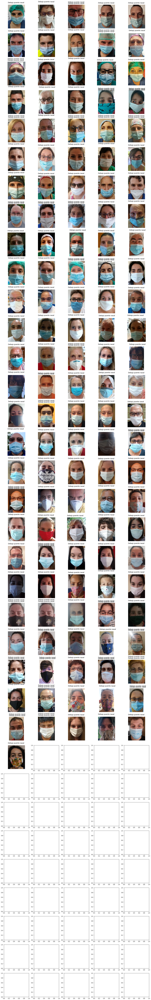

In [ ]:
#Visualiza imágenes y muestra los tipos de error
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2

#Visualiza los pimeros <number> imagenes y muestra los tipos de error
def show_images_tipo(tipo, number):
  NCOLS = 5 # número de columnas
  nrows = -(-number//NCOLS)  # número de filas (división entera redondeando hacia arriba)
  fig, ax = plt.subplots(nrows=nrows, ncols=NCOLS, figsize=(4*NCOLS,4*nrows))  
  df = pd.read_csv("http://servidor.upv.es/mascarillas/file.csv",sep=";")
  n_img = 0
  for i, j in df.iterrows():
    if n_img < number:
      id = j["ID"] 
      if id[-2:] == "_F":  # solo imágenes frontales
        if  os.path.exists("/tmp/frontal_recorte/"+id+".jpg") :  # solo si existe el fichero
          if  isinstance(j["LABEL1"], str) :  # Si es un String es que hay algún error
            if j["LABEL1"] == tipo :
              img = cv2.imread("/tmp/frontal_recorte/"+id+".jpg") 
              img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
              col = n_img % NCOLS
              row = n_img // NCOLS    
              n_img += 1
              ax[row,col].axis('Off')  
              ax[row,col].imshow(img)
              for n in range(1,5) :
                if isinstance(j["LABEL"+str(n)], str) :
                  #print(id+" "+"LABEL"+str(n)+" ->  "+j["LABEL"+str(n)])
                  ax[row,col].text(0, n*14-40, j["LABEL"+str(n)], fontsize=12) 
            
show_images_tipo("Debajo puente nasal", 175)

#Renombramos y separa entre bien/mal

Renombra cada imagen de la forma 0001_F.jpg, 0002_F.jpg, ...
Nuevo fichero csv generado  que contenga solo las imágenes frontales no borradas.
Separamos el corpues en bien/mal.


In [ ]:
# Renombra las imágenes, las separa entre bien/mal 

from os import makedirs
from shutil import copyfile
from shutil import make_archive
from google.colab import drive

drive.mount('/content/drive')

makedirs("/tmp/frontal_renom", exist_ok=True)
makedirs("/tmp/recort_bien_mal/mal", exist_ok=True)
makedirs("/tmp/recort_bien_mal/bien", exist_ok=True)


columns = ["FILE", "ID", "LABEL1", "LABEL2", "LABEL3", "LABEL4"] 
df_out = pd.DataFrame(columns=columns)

n_photo = 0
n_photo_front = 0
for i, j in df.iterrows():
   id = j["ID"]
   if id[-2:] == "_F":  # últimos dos caracteres
      n_photo_front += 1   
      if  os.path.exists("/tmp/frontal_recorte/"+id+".jpg") :  
         n_photo += 1
         file_name = str(n_photo).zfill(4)+"_F.jpg"
         df_out.loc[n_photo] = [file_name,id,j["LABEL1"],j["LABEL2"],j["LABEL3"],j["LABEL4"]]
         copyfile("/tmp/frontal_recorte/"+id+".jpg", \
            "/tmp/frontal_renom/"+file_name)
         if  isinstance(j["LABEL1"], str) :  # Si es un String es que hay algún error
            folder = "mal"
         else :  
            folder = "bien"
         copyfile("/tmp/frontal_recorte/"+id+".jpg", \
                 "/tmp/recort_bien_mal/"+folder+"/"+file_name) 
   
         
print("ficheros existentes: ", i, " ficheros copiados: ", n_photo  )           
df_out.to_csv("/tmp/labels.csv")
df_out.to_csv("/content/drive/MyDrive/Proyectos/Mascarillas/labels.csv")

make_archive('/tmp/recort_bien_mal', 'zip', '/tmp/recort_bien_mal')
#make_archive('/tmp/recort_bien_mal', 'zip', '/content/drive/MyDrive/Proyectos/Mascarillas/recort_bien_mal')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
ficheros existentes:  2617  ficheros copiados:  1277


'/tmp/recort_bien_mal.zip'

In [ ]:
copyfile("/tmp/recort_bien_mal.zip", \
                 "/content/drive/MyDrive/Proyectos/Mascarillas/recort_bien_mal.zip") 


'/content/drive/MyDrive/Proyectos/Mascarillas/recort_bien_mal.zip'

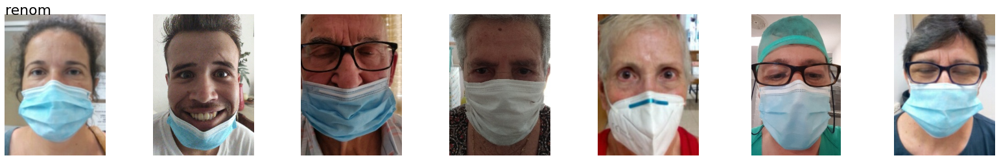

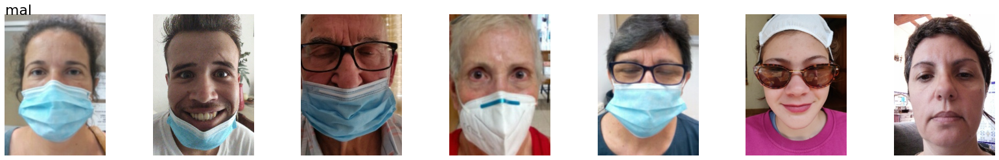

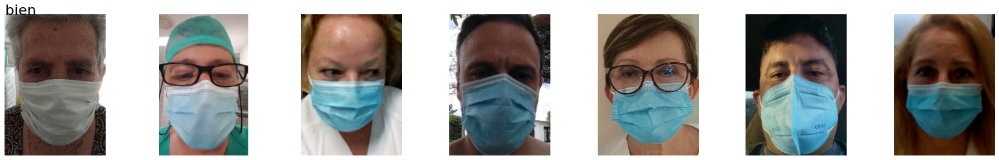

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#Visualiza los pimeros <number> imagenes, que encuentra en el directorio <dir>
def show_images(name, dir, number):
  fig, ax = plt.subplots(nrows=1, ncols=number, figsize=(4*number,4))
  ax[0].text(0, 0, name, fontsize=22)
  files = os.listdir(dir)
  for i in range(number):
    ax[i].axis('Off')
    ax[i].imshow(mpimg.imread(dir+'/'+files[i]))

show_images('renom', '/tmp/frontal_renom', 7)
show_images('mal', '/tmp/recort_bien_mal/mal', 7)
show_images('bien', '/tmp/recort_bien_mal/bien', 7)


#Renombramos añadiendo etiqueta principal

Renombra cada imagen de la forma 0001-.jpg, 0002-S_.jpg, ...
Nuevo fichero csv generado  que contenga solo las imágenes frontales no borradas.

Se añade al nombre del fichero la etiqueta:



**Letra - Problema  -  Apariciones en LABEL1**
```                        
  - Ok                    
S - Sin mascarilla         350/2
N - Debajo nariz           245/2
P - Debajo puente nasal    284/2
G - Gafas por debajo        82/2
L - Hueco Lateral           85/2

E - Mal extendida          247/2
M - No simetrica           108/2
O - Goma mal colocada       81/2
A - Mal ajuste nasal        71/2
C - Ajuste cuello           25/2
B - Barba                   2S 
```


Si hay más problemas se añade _ 


In [ ]:
# Renombra las imágenes, las separa entre bien/mal 
from os import makedirs
from shutil import copyfile
from shutil import make_archive
import pandas as pd

LETRAS       = {'Sin mascarilla':'S', 
                'Debajo nariz':'N',
                'Debajo puente nasal':'P',
                'Gafas por debajo':'G',
                'Hueco Lateral':'L',
                'Mal extendida':'E',
                'No simetrica':'M',
                'Goma mal colocada':'O',
                'Mal ajuste nasal':'A',
                'Ajuste cuello':'C',
                'Barba':'B'}

#makedirs("/tmp/etiquetado", exist_ok=True)
makedirs("/tmp/etiquetado/OK", exist_ok=True)
for key, value in LETRAS.items():
  makedirs("/tmp/etiquetado/"+value, exist_ok=True)
  makedirs("/tmp/etiquetado/"+value+'_', exist_ok=True)

df = pd.read_csv("http://servidor.upv.es/mascarillas/file.csv",sep=";")
#df_out = pd.DataFrame(columns=["FILE", "ID", "LABEL1", "LABEL2", "LABEL3", "LABEL4"])

n_photo = 0
n_photo_front = 0
for i, j in df.iterrows():
   id = j["ID"]
   if id[-2:] == "_F":  # últimos dos caracteres
      n_photo_front += 1   
      if  os.path.exists("/tmp/frontal_recorte/"+id+".jpg") :  
         n_photo += 1
         file_name = str(n_photo).zfill(4)+"-"
         #df_out.loc[n_photo] = [file_name,id,j["LABEL1"],j["LABEL2"],j["LABEL3"],j["LABEL4"]]

         label1 = j["LABEL1"]
         if not isinstance(label1, str) :
           dir = 'OK'
         else :
           dir = LETRAS[label1]
           if isinstance(j["LABEL2"], str) :  # Hay LABEL2
             dir += '_'
           file_name += dir
         copyfile("/tmp/frontal_recorte/"+id+".jpg", \
            "/tmp/etiquetado/"+dir+"/"+file_name+".jpg")
         
print("ficheros existentes: ", i )           
#df_out.to_csv("/tmp/labels.csv")

make_archive('/tmp/etiquetado', 'zip', '/tmp/etiquetado')
#make_archive('/tmp/recort_bien_mal', 'zip', '/content/drive/MyDrive/Proyectos/Mascarillas/recort_bien_mal')

ficheros existentes:  2617


'/tmp/etiquetado.zip'

#Recorte de caras 

In [ ]:
# install pnslib
!pip install git+git://github.com/PnS2019/pnslib.git

  Cloning git://github.com/PnS2019/pnslib.git to /tmp/pip-req-build-k5v618jm
  Running command git clone -q git://github.com/PnS2019/pnslib.git /tmp/pip-req-build-k5v618jm
  Created wheel for pnslib: filename=pnslib-0.1.0a1-cp37-none-any.whl size=1489618 sha256=f6a620f39a6502425c14281e23fc9f4040803db553bfd150d5a570a325f3b776
  Stored in directory: /tmp/pip-ephem-wheel-cache-uikt87zr/wheels/a2/8e/a9/c62e72840009deaa723b3a113d5c3b90acac77098d16e90eca
Successfully built pnslib


FileNotFoundError: ignored

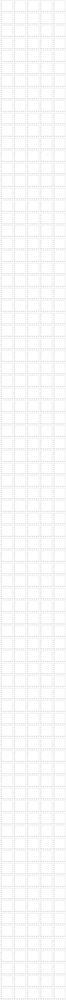

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
#import matplotlib.image as mpimg
import cv2
from pnslib import utils

# load face cascade 
face_cascade = cv2.CascadeClassifier(
   utils.get_haarcascade_path('haarcascade_frontalface_default.xml'))
eye_cascade = cv2.CascadeClassifier(
    utils.get_haarcascade_path('haarcascade_eye.xml'))


NCOLS = 5 # número de columnas

#Visualiza los pimeros <number> imagenes, que encuentra en el directorio <dir> y busca si hay caras
def show_faces(dir, number):
   nrows = -(-number//NCOLS)  # número de filas (división entera redondeando hacia arriba)
   nrows = 80
   fig, ax = plt.subplots(nrows=nrows, ncols=NCOLS, figsize=(4*NCOLS,4*nrows))            
   files = os.listdir(dir)
   n_img = 0
   for i in range(number):
      img = cv2.imread(dir+'/'+files[i])      
#      img_with = img.
      gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
      faces = face_cascade.detectMultiScale(gray, 1.03, 1, minSize=(100,100)) #1.3, 5
      if (len(faces)!=1) :
       for (x, y, w, h) in faces:
         h = round(h*1.5)
         y = y-round(h*0.2)
         cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)
         '''roi_gray = gray[y:y+h, x:x+w]
         roi_color = img[y:y+h, x:x+w]
         eyes = eye_cascade.detectMultiScale(roi_gray, 1.03, 5)
         for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)'''
       #eyes = eye_cascade.detectMultiScale(gray, 1.03, 5)
       #for (ex, ey, ew, eh) in eyes:
       #     cv2.rectangle(img, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

       img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
       col = n_img % NCOLS # i
       row = n_img // NCOLS # i    
       n_img += 1
       ax[row,col].axis('Off')  
       ax[row,col].imshow(img)
       ax[row,col].text(0, 0, files[i], fontsize=12) #'''str(faces.size)+"-"+'''
   print(n_img,"/",number)

show_faces( '/tmp/bien_mal/mal', 797)